### Imports and Setup

In [74]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pd.options.display.max_columns = 100
pd.options.display.max_rows = 25

## 01 Data Ingestion and Getting to Know Your Data

In [75]:
# Read the zipped csv assignment01_sales_data_modified.zip creating a dataframe called "df"
# While reading the data, parse any date columns and specify column names using the col_names list provided below
# Using the compression argument to uncompress the data
# Using the header names in the list below
col_names = ['Order_Number','Order_Date','Line_Item_Number','Quantity_Ordered_lbs','Price_Each','Sales',
             'Status','Product_Category','MSRP','Product_Code','Customer_Name','Customer_City','Customer_State',
             'Deal_Size','Customer_Status']
df = pd.read_csv('assignment01_sales_data_modified (1).zip',
                 compression='zip',
                 header=0,
                 names=col_names,
                 parse_dates=['Order_Date'])


In [76]:
# 1.2 In this cell, print the shape of the dataframe
df.shape

(2846, 15)

In [77]:
# 1.3 In this cell, show the first 3 rows of the dataframe
df.head(3)

,Order_Number,Order_Date,Line_Item_Number,Quantity_Ordered_lbs,Price_Each,Sales,Status,Product_Category,MSRP,Product_Code,Customer_Name,Customer_City,Customer_State,Deal_Size,Customer_Status
0,12139,2018-02-24,2,109,210.94,22889.76,Shipped,Poultry,1,10120,COSTCO,Austin,TX,Small,Active
1,11398,2018-05-07,5,128,172.22,22101.37,Shipped,Poultry,1,10120,COSTCO,Atlanta,GA,Small,Active
2,14215,2018-07-01,2,129,203.46,26314.01,Shipped,Poultry,1,10120,WALMART,Palm Beach,FL,Medium,Active


In [78]:
# 1.4 In this cell, show the last 3 rows of the dataframe
df.tail(3)

,Order_Number,Order_Date,Line_Item_Number,Quantity_Ordered_lbs,Price_Each,Sales,Status,Product_Category,MSRP,Product_Code,Customer_Name,Customer_City,Customer_State,Deal_Size,Customer_Status
2843,11835,2019-05-18,6,122,147.74,18023.23,Shipped,Poultry,1,10136,WALMART,Palm Beach,FL,Small,Active
2844,12881,2018-11-25,9,159,217.66,34592.59,Shipped,Pork,1,10136,WALMART,Austin,TX,Medium,Active
2845,13476,2018-06-27,7,120,155.77,18764.83,Shipped,Fresh Produce Fruits,1,10200,COSTCO,Houston,TX,Small,Active


In [79]:
# 1.5 In this cell, output the data types of df using dtypes
df.dtypes

Order_Number                     int64
Order_Date              datetime64[ns]
Line_Item_Number                 int64
Quantity_Ordered_lbs             int64
Price_Each                     float64
Sales                          float64
Status                          object
Product_Category                object
MSRP                             int64
Product_Code                     int64
Customer_Name                   object
Customer_City                   object
Customer_State                  object
Deal_Size                       object
Customer_Status                 object
dtype: object

In [80]:
# 1.6 In this cell, output the data types of df using info()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2846 entries, 0 to 2845
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Order_Number          2846 non-null   int64         
 1   Order_Date            2846 non-null   datetime64[ns]
 2   Line_Item_Number      2846 non-null   int64         
 3   Quantity_Ordered_lbs  2846 non-null   int64         
 4   Price_Each            2846 non-null   float64       
 5   Sales                 2846 non-null   float64       
 6   Status                2846 non-null   object        
 7   Product_Category      2846 non-null   object        
 8   MSRP                  2846 non-null   int64         
 9   Product_Code          2846 non-null   int64         
 10  Customer_Name         2832 non-null   object        
 11  Customer_City         2832 non-null   object        
 12  Customer_State        2832 non-null   object        
 13  Deal_Size         

In [81]:
# 1.7 In this cell, show the output on df of describe()
df.describe()

,Order_Number,Line_Item_Number,Quantity_Ordered_lbs,Price_Each,Sales,MSRP,Product_Code
count,2846.000000,2846.000000,2846.000000,2846.000000,2846.000000,2846.0,2846.000000
mean,13225.094167,6.476458,135.849965,184.354280,25047.324933,1.0,10294.489108
std,1065.743520,4.229112,17.480825,24.504646,4682.514459,0.0,425.864633
min,11217.000000,1.000000,84.000000,109.040000,11982.150000,1.0,10120.000000
25%,12272.000000,3.000000,123.000000,169.492500,21637.840000,1.0,10136.000000
50%,13244.000000,6.000000,136.000000,186.800000,25026.415000,1.0,10136.000000
75%,14180.000000,9.000000,149.000000,202.902500,28288.357500,1.0,10148.000000
max,15269.000000,18.000000,194.000000,224.770000,41566.120000,1.0,11500.000000


In [82]:
pip install ydata-profiling


In [83]:
# 1.8 In this cell, run a profile report using Pandas Profiling outputting the results in this notebook
from ydata_profiling import ProfileReport
profile=ProfileReport(df,minimal=True)
profile.to_widgets()
profile.to_notebook_iframe

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:507: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

<bound method ProfileReport.to_notebook_iframe of >

## 02 Exploratory Data Analysis

In [84]:
# 2.1 In this cell, using a loop over all the columns in df,
for i in df.columns:
  if df[i].dtype==object:
    print(i,':',df[i].nunique())

Status : 1
Product_Category : 7
Customer_Name : 2
Customer_City : 21
Customer_State : 4
Deal_Size : 3
Customer_Status : 1


In [85]:
# 2.2 In this cell, run nunique() again for the column with the most unique values in the list above
print(df['Customer_City'].nunique())
print(df['Customer_City'].unique())

21
['Austin' 'Atlanta' 'Palm Beach' 'San Antonio' 'Cape Coral' 'Houston'
 'Corpus Christi' 'Dallas' 'Augusta' 'Texas City' 'Fort Worth'
 'Jacksonville' 'Tampa' 'Galveston' 'Macon' 'Savannah' 'El Paso'
 'New Orleans' 'Shreveport' 'Baton Rouge' nan 'Columbus']


In [86]:
# 2.3 In this cell, show unique values on the Product Category column
print(df['Product_Category'].unique())

['Poultry' 'Fresh Produce Vegetables' 'Pork' 'Fresh Produce Fruits' 'Beef'
 'Dairy' 'Bread']


In [87]:
# 2.4 In this cell, show value counts on Customer Name
print(df['Customer_Name'].value_counts())

WALMART    1559
COSTCO     1273
Name: Customer_Name, dtype: int64


In [88]:
# 2.5 In this cell, show value counts on Product Category
print(df['Product_Category'].value_counts())

Fresh Produce Vegetables    972
Fresh Produce Fruits        615
Poultry                     337
Beef                        306
Pork                        302
Dairy                       237
Bread                        77
Name: Product_Category, dtype: int64


In [89]:
# 2.6 In this cell, show value counts on Product Cateogry sorted by the index
print(df['Product_Category'].value_counts().sort_index())

Beef                        306
Bread                        77
Dairy                       237
Fresh Produce Fruits        615
Fresh Produce Vegetables    972
Pork                        302
Poultry                     337
Name: Product_Category, dtype: int64


In [90]:
# 2.7 In this cell, show the top 5 value counts on Customer City
print(df['Customer_City'].value_counts())

Houston           428
San Antonio       337
Corpus Christi    200
Dallas            187
Fort Worth        181
Austin            177
El Paso           168
Galveston         161
Palm Beach        153
Jacksonville      141
Tampa             129
Cape Coral        117
Atlanta            93
Augusta            51
Macon              51
Columbus           47
Texas City         46
Savannah           46
New Orleans        43
Shreveport         39
Baton Rouge        37
Name: Customer_City, dtype: int64


always arranged in order

In [91]:
print(df['Customer_City'].value_counts().head(5))

Houston           428
San Antonio       337
Corpus Christi    200
Dallas            187
Fort Worth        181
Name: Customer_City, dtype: int64


## 03 Data Visualization

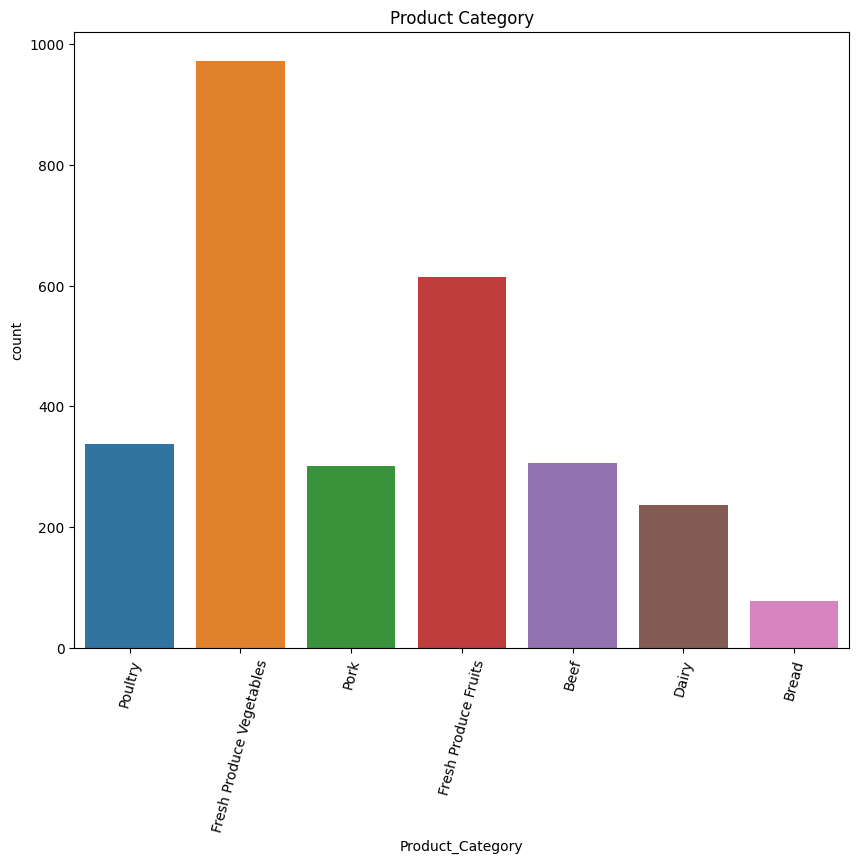

In [92]:
# 3.1 In this cell, create a bar plot with Seaborn showing Product Category on the x-axis and the dataframe index on the y-axis
plt.figure(figsize=(10,8))
sns.countplot(x='Product_Category', data=df)
plt.title('Product Category')
plt.xticks(rotation=75)
plt.show()

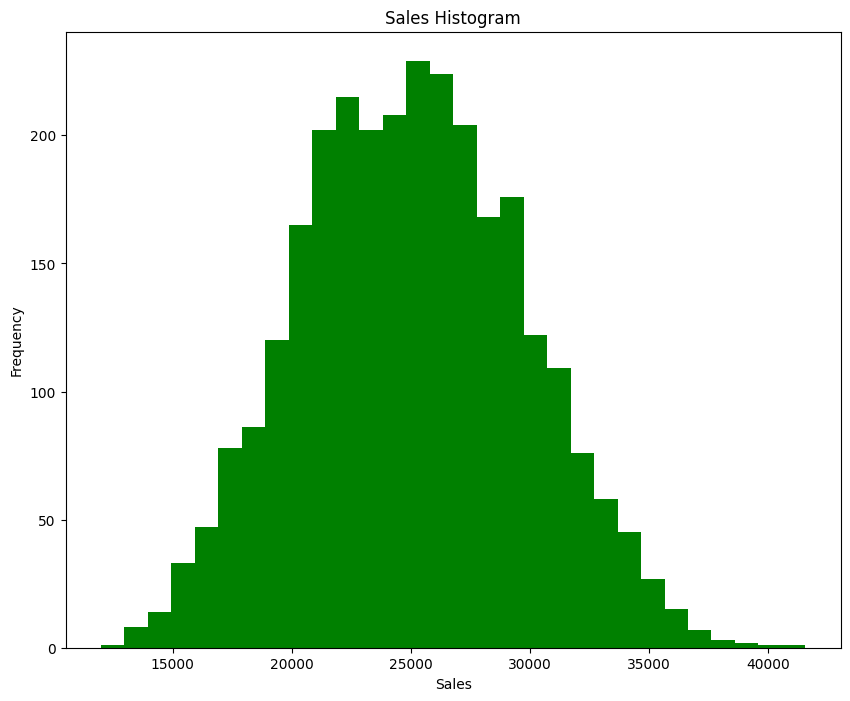

In [93]:
# 3.2 In this cell, create a histogram with Matplotlib showing Sales
plt.figure(figsize=(10,8))
plt.hist(df['Sales'], bins=30, color='g')
plt.title('Sales Histogram')
plt.xlabel('Sales')
plt.ylabel('Frequency')
plt.show()


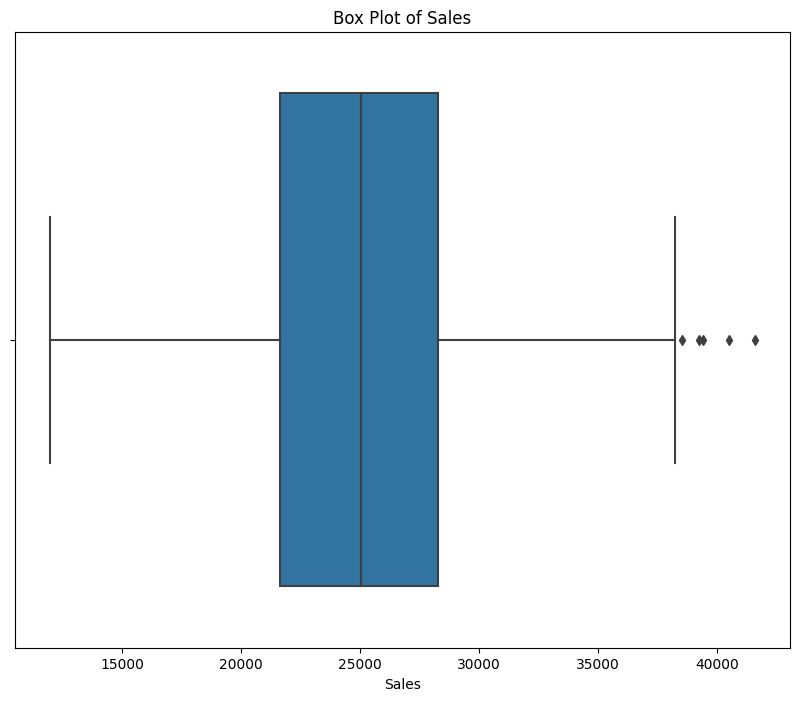

In [94]:
# 3.3 In this cell, create a box plot with Seaborn for Sales
plt.figure(figsize=(10,8))
sns.boxplot(x=df['Sales'])
plt.title('Box Plot of Sales')
plt.show()


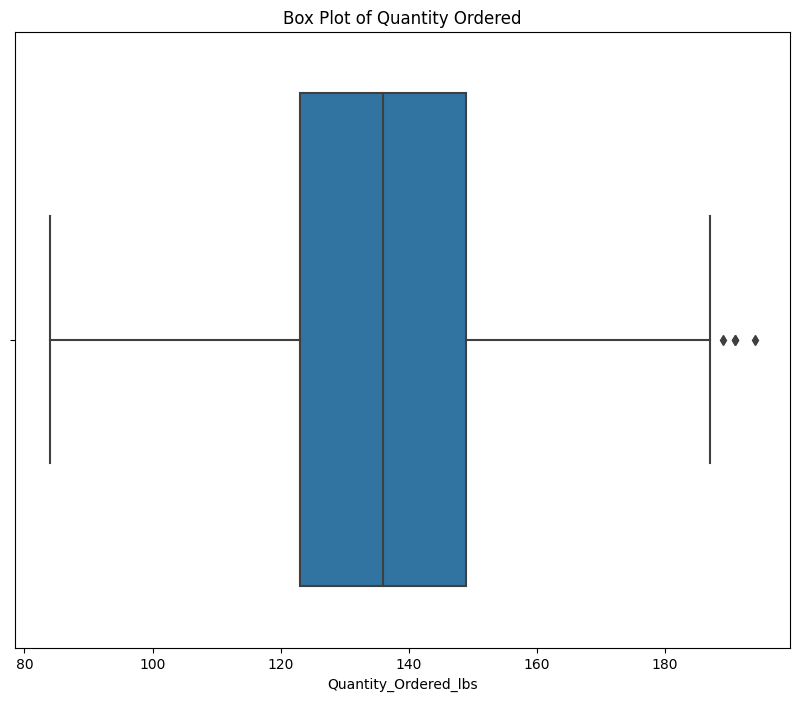

In [95]:
# 3.4 In this cell, create a box plot with Seaborn for Quantity Ordered
plt.figure(figsize=(10,8))
sns.boxplot(x=df['Quantity_Ordered_lbs'])
plt.title('Box Plot of Quantity Ordered')
plt.show()

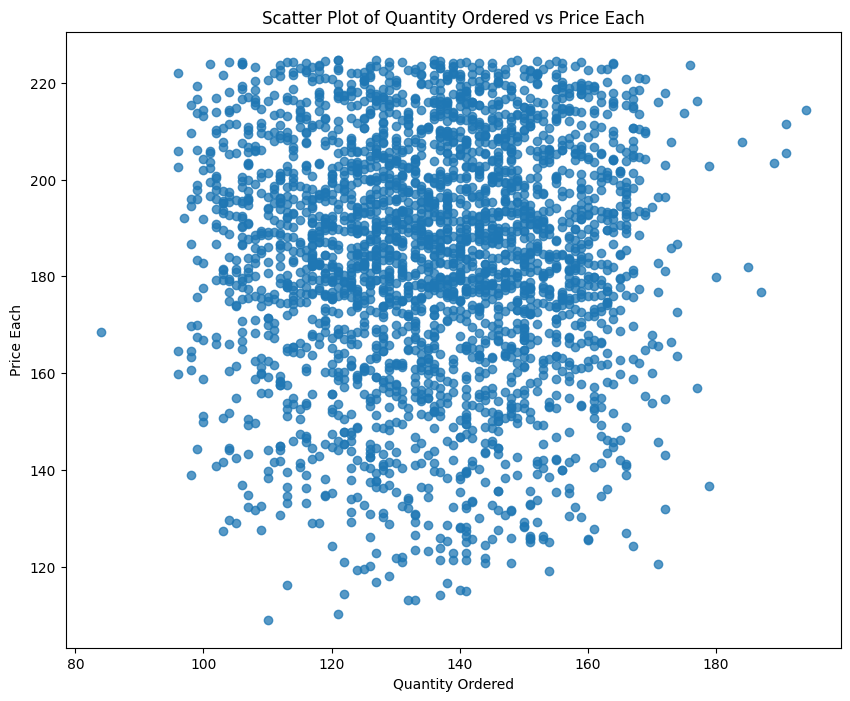

In [96]:
# 3.5 creating a scatter plot with Matplotlib with Quantity Ordered on the x and y axis
plt.figure(figsize=(10,8))
plt.scatter(df['Quantity_Ordered_lbs'], df['Price_Each'], alpha=0.75)
plt.title('Scatter Plot of Quantity Ordered vs Price Each')
plt.xlabel('Quantity Ordered')
plt.ylabel('Price Each')
plt.show()


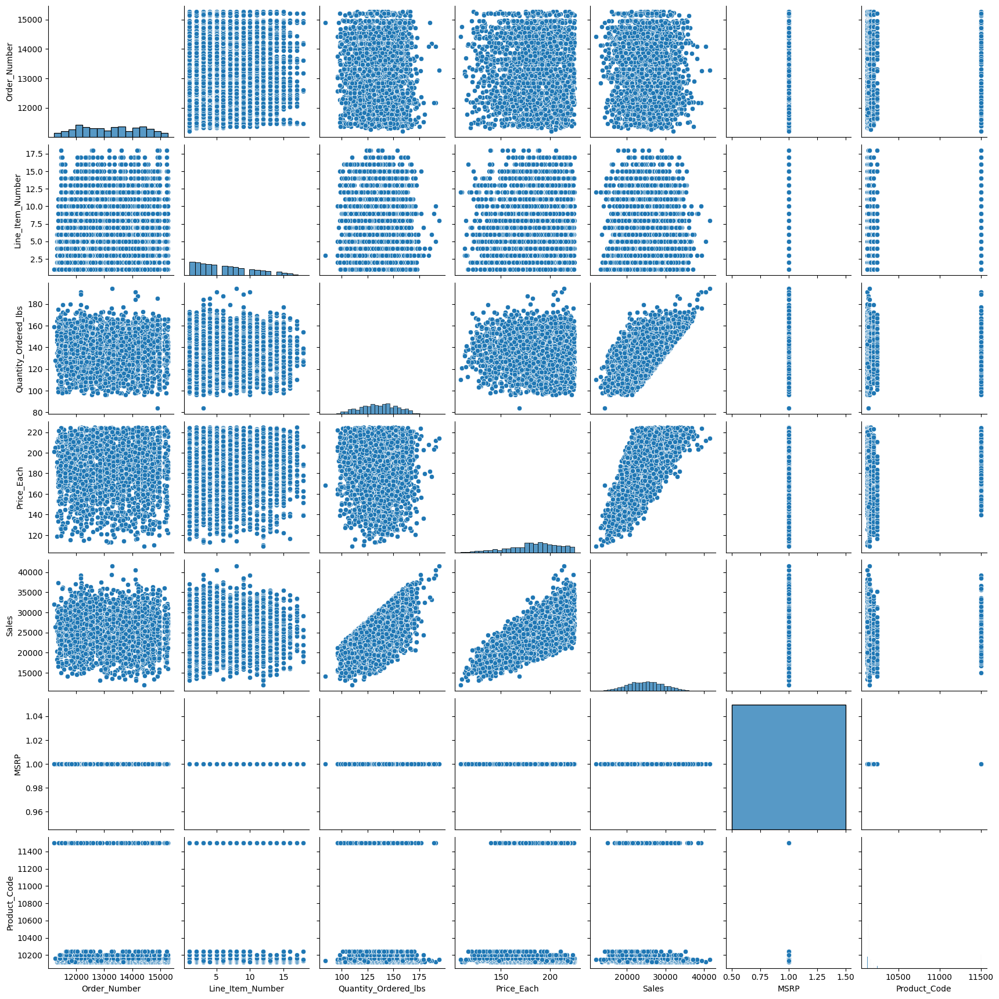

In [97]:
# 3.6 In this cell, create a pairplot using Seaborn on the dataframe
sns.pairplot(df)

<Axes: >

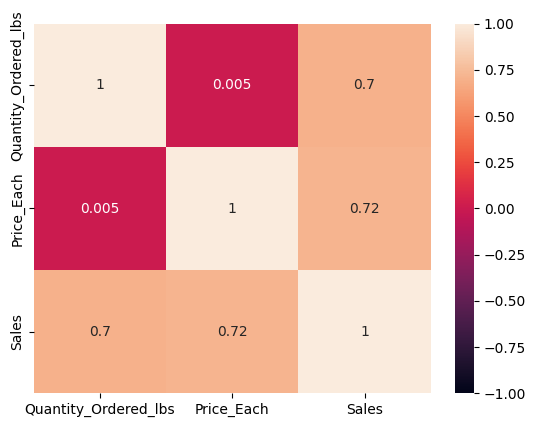

In [98]:
# 3.7 In this cell, create a correlation heatmap using Seaborn of Quantity Ordered, Price Each, and Sales
corr = df[['Quantity_Ordered_lbs', 'Price_Each', 'Sales']].corr(method='pearson')

sns.heatmap(corr, annot=True, vmin=-1, vmax=1)


## 04 Additional Exploratory Data Analysis & Initial Cleaning

In [99]:
# 4.1 In this cell, overwrite the current df by sorting the dataset by Order Date and Line Item Number
df = df.sort_values(by=['Order_Date', 'Line_Item_Number'])
df = df.reset_index(drop=True)
df.head()

,Order_Number,Order_Date,Line_Item_Number,Quantity_Ordered_lbs,Price_Each,Sales,Status,Product_Category,MSRP,Product_Code,Customer_Name,Customer_City,Customer_State,Deal_Size,Customer_Status
0,11411,2018-01-06,1,161,150.66,24275.32,Shipped,Fresh Produce Fruits,1,10148,WALMART,Houston,TX,Small,Active
1,11411,2018-01-06,2,164,175.91,28873.34,Shipped,Fresh Produce Fruits,1,10136,WALMART,Houston,TX,Medium,Active
2,11411,2018-01-06,3,128,216.74,27667.74,Shipped,Fresh Produce Fruits,1,10136,WALMART,Houston,TX,Medium,Active
3,11411,2018-01-06,4,106,192.45,20364.47,Shipped,Fresh Produce Fruits,1,10136,WALMART,Houston,TX,Small,Active
4,11783,2018-01-09,1,134,183.80,24717.56,Shipped,Fresh Produce Fruits,1,10136,WALMART,Galveston,TX,Medium,Active


In [100]:
# 4.2 In this cell, create a dataframe called df_snapshot

df_snapshot = df.iloc[500:1001, 1:7]
print(df_snapshot)


     Order_Date  Line_Item_Number  Quantity_Ordered_lbs  Price_Each     Sales  \
500  2018-10-05                10                   148      131.75  19561.59   
501  2018-10-05                11                   147      195.41  28728.00   
502  2018-10-06                 1                   142      211.02  30060.93   
503  2018-10-06                 1                   157      167.45  26277.51   
504  2018-10-06                 2                   149      190.33  28280.82   
...         ...               ...                   ...         ...       ...   
996  2018-12-09                 2                   159      170.54  27193.91   
997  2018-12-09                 3                   107      195.81  21015.17   
998  2018-12-09                 4                   149      149.62  22359.47   
999  2018-12-09                 5                   107      181.69  19388.75   
1000 2018-12-09                 6                   133      175.10  23298.56   

       Status  
500   Shipp

In [101]:
# 4.3 In this cell, create a dataframe called df_produce_fruits
# filtered to where Product Category is "Fresh Produce Fruits"
# Only keep the following columns: Product Category, Order Date, Line Item Number, Quantity Ordered, Price Each, and Sales
df_produce_fruits = df[df['Product_Category'] == 'Fresh Produce Fruits'][['Product_Category', 'Order_Date', 'Line_Item_Number', 'Quantity_Ordered_lbs', 'Price_Each', 'Sales']].copy()
df_produce_fruits = df_produce_fruits.reset_index(drop=True)

print(df_produce_fruits.head(3))


       Product_Category Order_Date  Line_Item_Number  Quantity_Ordered_lbs  \
0  Fresh Produce Fruits 2018-01-06                 1                   161   
1  Fresh Produce Fruits 2018-01-06                 2                   164   
2  Fresh Produce Fruits 2018-01-06                 3                   128   

   Price_Each     Sales  
0      150.66  24275.32  
1      175.91  28873.34  
2      216.74  27667.74  


In [102]:
# 4.4 In this cell, run duplicated() and any() to determine if the dataframe (df) has any duplicates
has_duplicates = df.duplicated().any()

print(has_duplicates)


True


In [103]:
# 4.5 In this cell, run duplicated() and sum() to report the number of duplicates in df
num_duplicates = df.duplicated().sum()
print(num_duplicates)

10


In [104]:
# 4.6 In this cell, print the shape of df
print("Original shape:", df.shape)
df.drop_duplicates(inplace=True)
print("New shape:", df.shape)

Original shape: (2846, 15)
New shape: (2836, 15)


In [105]:
# 4.7 Functions used for identifying mixed data types, this cell must be run to be referenced by future cells
def get_column_data_types(df):
    """Returns a dictionary of each column listing the data types within the column"""

    multiple_types = {}

    for col in df.columns:
        types_df = df[col].dropna().apply(lambda x: x.__class__).value_counts()
        if types_df.shape[0] > 1:
            multiple_types[col] = types_df.index.values.tolist()

    return multiple_types


def has_multi_types_within_col(df):
    """Returns True if any column in the df has multiple data types within the column"""

    return len(get_column_data_types(df).keys()) > 0

In [106]:
# 4.8 In this cell, execute the has_multi_types_within_col function and print the output to show if any columns have more than one data type on df
has_multi_types = has_multi_types_within_col(df)
print(has_multi_types)


False


In [107]:
# 4.9 In this cell, execute the get_column_data_types function on the dataframe and print the output to show the column and data
column_data_types = get_column_data_types(df)
print(column_data_types)

{}


In [108]:
# 4.10 In this cell, execute the get_single_value_cols function to determine if any columns have one single value on df
def get_single_value_cols(df):
    '''Returns list of columns that contain only one value'''

    single_val_cols = []
    for col in df.columns:
        if len(df[col].unique()) == 1:
            single_val_cols.append(col)

    return single_val_cols

In [109]:
# 4.11 In this cell, drop columns identified in the output of get_single_value_cols in place using drop()
single_value_cols = get_single_value_cols(df)

# Drop single value columns
df.drop(columns=single_value_cols, inplace=True)

# Print the DataFrame shape
print(df.shape)

# Print the first 3 rows of the DataFrame
print(df.head(3))


(2836, 12)
   Order_Number Order_Date  Line_Item_Number  Quantity_Ordered_lbs  \
0         11411 2018-01-06                 1                   161   
1         11411 2018-01-06                 2                   164   
2         11411 2018-01-06                 3                   128   

   Price_Each     Sales      Product_Category  Product_Code Customer_Name  \
0      150.66  24275.32  Fresh Produce Fruits         10148       WALMART   
1      175.91  28873.34  Fresh Produce Fruits         10136       WALMART   
2      216.74  27667.74  Fresh Produce Fruits         10136       WALMART   

  Customer_City Customer_State Deal_Size  
0       Houston             TX     Small  
1       Houston             TX    Medium  
2       Houston             TX    Medium  
